# Chapter 1: A Tale of Two Models: Transformers and Diffusions

This chapter covers
* Two ways of text-to-image generation: Transformers and Diffusions
* A vision Transformer (ViT) converts an image into a sequence of image patches, allowing sequential predictions
* Transformer-based text-to-image models create one image token at a time until all image patches in the image are generated 
* Diffusion-based text-to-image models create an image from pure noise based on a text prompt, iteratively denoising the image until the final output matches the prompt 
* New developments and limitations of text-to-image generation models

Generative AI is evolving rapidly, revolutionizing every aspect of our lives and work. Text-to-image models, in particular, have gained significant attention due to their ability to translate natural language into visually rich, meaningful images. Models like OpenAI’s DALL-E series, Google’s Imagen, and Stability AI’s Stable Diffusion have shown unprecedented advances in the field of generative AI, turning abstract descriptions into detailed, highly creative visual representations. 

Understanding these state-of-the-art text-to-image models is essential for anyone interested in keeping up with the fast-changing landscape of generative AI for a couple of reasons. First, text-to-image models represent a significant leap in multimodal AI, where different types of data (text, images, audio, video) are processed and generated together. These models demonstrate how generative systems are evolving beyond single-modal tasks, such as pure text generation or image recognition, to something more complex and interconnected. Studying these models allows us to gain insight into how future systems might combine various modalities to create even richer, more nuanced outputs. These text-to-image models blur the boundaries between textual and visual creativity. They demonstrate how advances in natural language processing (NLP) can be coupled with advancements in computer vision, requiring a deeper understanding of how generative AI blends multiple data streams. As these technologies evolve, future AI systems will likely rely more heavily on multimodal interaction, where understanding models that integrate language and vision will be critical.

Second, the ability to transform text into images has immediate real-world applications across multiple industries. Designers, marketers, game developers, and content creators can use these models to rapidly prototype and iterate ideas. Artists can expand their creative process by generating image drafts based on descriptions, while healthcare professionals can use such models for better visual communication of complex medical data. Understanding these tools provides an edge in industries where generative AI will continue to disrupt traditional workflows. Whether for generating product mockups, creating personalized art, or enhancing educational materials, mastering text-to-image models provides a competitive advantage. Companies that integrate these models can automate time-consuming design processes, personalize content at scale, and innovate in ways that were previously unachievable.

As generative AI reshapes industries and society, text-to-image models stand at the forefront of these changes. Understanding the inner workings of these models allows us to not only have a deeper appreciation of current developments, but also anticipate and contribute to future innovations. These models serve as a window into the larger, more complex multimodal systems that will no doubt define the next phase of AI evolution. Keeping up with these advancements is not just about technical literacy; it’s about understanding the very future of creativity, communication, and technology itself. 

In this book, I'll focus on two ways of generating images from text prompts: vision Transformers (ViT) and diffusion models. In the first method, we divide an image into multiple patches and treat each patch as an element in a sequence. As a result, image generation becomes a sequence prediction problem. When generating an image based on a text prompt, we ask the trained Transformer to first predict the top left patch. In the next iteration, we feed the first patch, along with the prompt, to the ViT and ask it to predict the second patch. We repeat the process until we have all the needed patches in the image.

The second way of text-to-image generation is based on diffusion models. We start with an image with pure noise. We ask the trained diffusion model to denoise it slightly, conditional on the text prompt. The result is a less noisy image. We repeat the process many times until we obtain a clean image that matches the text prompt. Diffusion models have become the go-to generative model by learning progressively removing noise from noisy images. They form the foundation of the state-of-the-art text-to-image models, including Imagen, DALL-E 2 (though not DALL-E), and Stable Diffusion.

In this book, we’ll dive deep into the inner workings of these two ways of text-to-image generation. You’ll start with implementing Transformers and the attention mechanism line by line so you understand how the attention mechanism uses query, key, and value to capture the relations among elements in a sequence. Understanding attention and Transformers is crucial for text-to-image generation: one of the two ways of text-to-image generation is based on the Transformer architecture explicitly; even though the second method of text-to-image generation, diffusion models, is not explicitly based on Transformers, attention and Transformers are working behind the scenes. 

This chapter will provide an overview of how the two ways of text-to-image generation (Transformers and diffusions) work. I’ll explain various components in each method, how the model is trained, and how to use the trained model to generate images based on textual descriptions. At the end of the chapter, I’ll discuss the limitations, challenges, and concerns related to these state-of-the-art text-to-image generation models. 

# 1. Generate Images Sequentially from Text Descriptions
As we mentioned in the introduction, the first way of text-to-image generation treats the task as a sequence-prediction problem with a Transformer. Specifically, an image is divided into multiple patches (for example, into a 16 by 16 grid, hence 16X16=256 patches). These patches are then ordered into a sequence: the top left patch first, the patch to the right next, and so on. Based on a text prompt, a trained Transformer predicts the first patch in the image. In the second iteration, the Transformer predicts the second patch based on the first patch and the text prompt. We repeat the process until all 256 patches in the images are generated. 

In this section, I’ll first show you an example of how a pretrained Transformer can generate an image from a text prompt ("panda with top hat reading a book"). Not only can you see the generated image, you can also see the intermediate steps (when 25, 91, …, and all of the 256 patches of the image are generated). I’ll then explain how to build and train a vision Transformer (ViT) from scratch to convert an image to a sequence of image tokens. Finally, I’ll explain how a text-to-image generation Transformer is trained and used. 

## 1.1 Examples from a text-to-image generation Transformer
OpenAI’s DALL-E (though not DALL-E 2) generates images from text based on a Transformer architecture instead of diffusion models. However, DALL-E is not open-sourced. In Chapter 16 of this book, you’ll attempt to replicate how DALL-E works, based on Boris Dayma et al.’s DALL-E mini project (https://github.com/borisdayma/dalle-mini) and Brett Kuprel’s min DALL-E project (https://github.com/kuprel/min-dalle).

You'll use "panda with top hat reading a book" as the text prompt. You’ll learn to load up the four components of the trained model: the text tokenizer, the BART encoder, the BART decoder, and the VQGAN detokenizer. You'll see how the prompt is converted to tokens, and then indexes, which are used as inputs to the BART encoder. The encoded text is then fed to the BART decoder to predict image tokens in an autoregressive fashion (the top left image patch first, then the one to the right, and so on). The decoded image tokens are fed to the VQGAN detokenizer to convert them into a high-resolution image for you to see on your computer.
The generated image based on the prompt "panda with top hat reading a book" is shown in Figure 1.1:

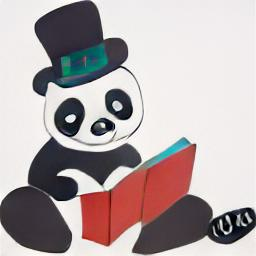
 
Figure 1.1: An image generated by a Transformer with the prompt "panda with top hat reading a book."

We also select 8 intermediate steps to visualize how the image was generated step by step, as shown in Figure 1.2.

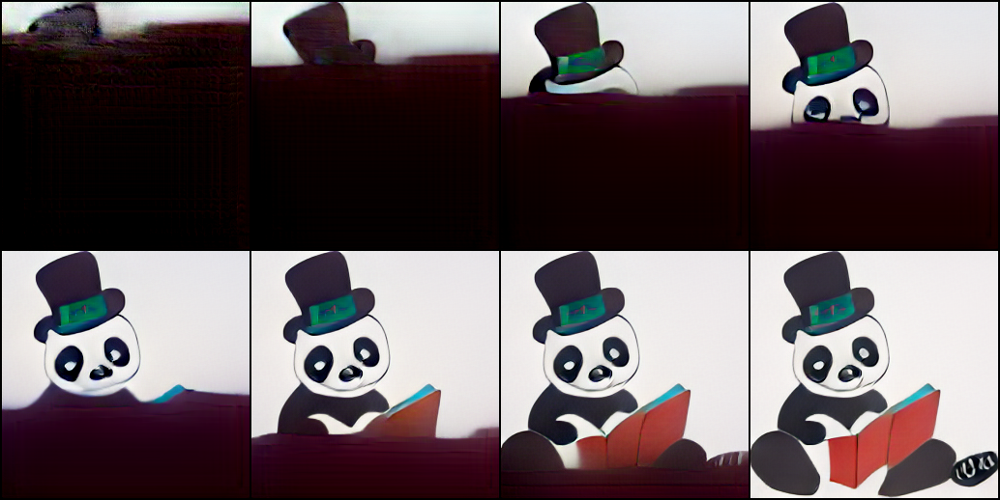

Figure 1.2: We display 8 images in the 2 by 4 grid. An image is divided into 256 patches, organized in a 16x16 grid. The top left image shows the output when 25 image patches are generated. The second image in the top row shows the output when 58 patches are generated. The rest images show the outputs when 91, 124, ..., and 256 patches are generated.

Better yet, in an animation, you'll visualize the intermediate steps of the image generation process. What does the image look like when only 25 of the 265 patches are generated? What if 58 patches are generated? and so on. The animation to illustrate the image generation process can be seen on my website here https://gattonweb.uky.edu/faculty/lium/v/minDALLE.gif.

## 1.2 How Vision Transformer Divides Images into A Sequence of Patches
A key step in text-to-image generation models is to convert an image into a sequence of image tokens, similar to a sequence of words in text. Based on this idea, a group of Google researchers in 2020 applied Transformer models to computer vision tasks, in a groundbreaking paper titled "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale." Vision Transformer (ViT) can achieve state-of-the-art performance on various computer vision tasks. 
In Chapter 4 of this book, you'll learn to create a ViT from scratch and train it to classify images in the CIFAR-10 dataset. In particular, you'll learn to convert an image into an 8 by 8 grid. You'll then convert each of the 64 patches in the image into a token. Hence an image can be treated as a sequence of 64 tokens. You'll then build a Transformer as a classifier. The self-attention mechanism in the Transformer allows the model to learn the relations among different patches in the image. You'll feed images in the CIFAR-10 dataset to the model to train the ViT. After training, you'll learn to use the trained model to classify unseen images, with great accuracy. Further, you'll visualize how a trained ViT pays attention to different parts of an image, as shown in Figure 1.3. 

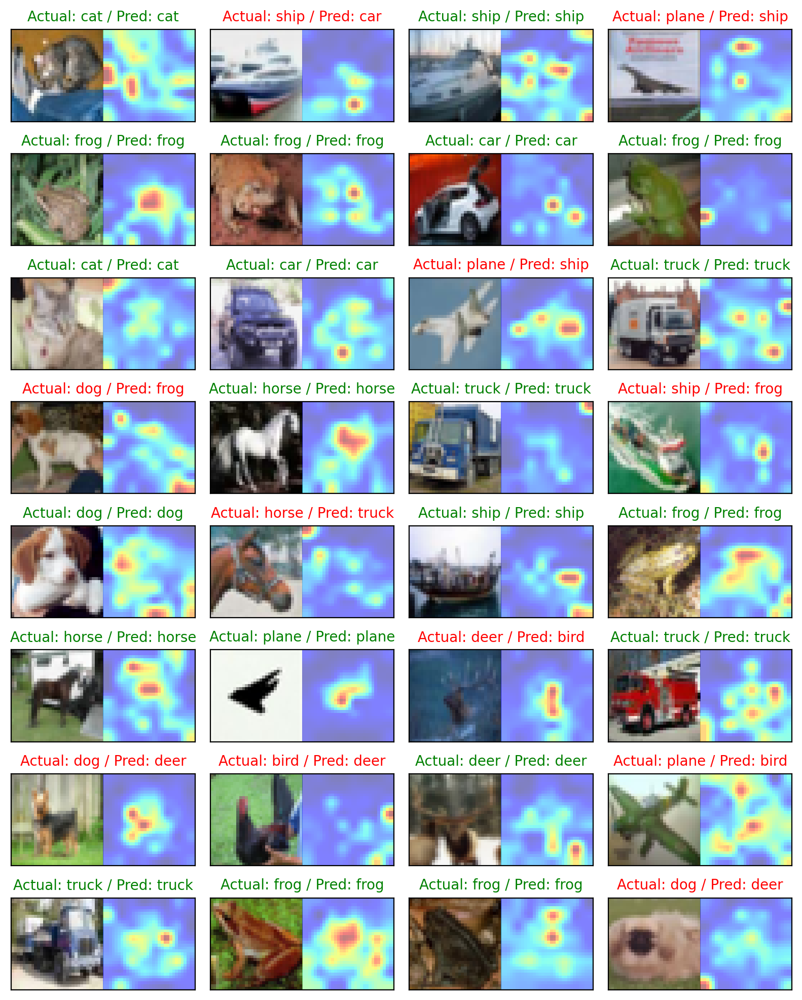

Figure 1.3: How a trained vision Transformer pays attention to different areas of an image. 

The image on the left in each pair is the original CIFAR-10 image, whereas the image on the right shows the attention map based on the attention scores calculated in the trained ViT. 

## 1.3 Training and Using A Text-to-Image Transformer
The architecture of the text-to-image Transformer is shown in Figure 1.4.

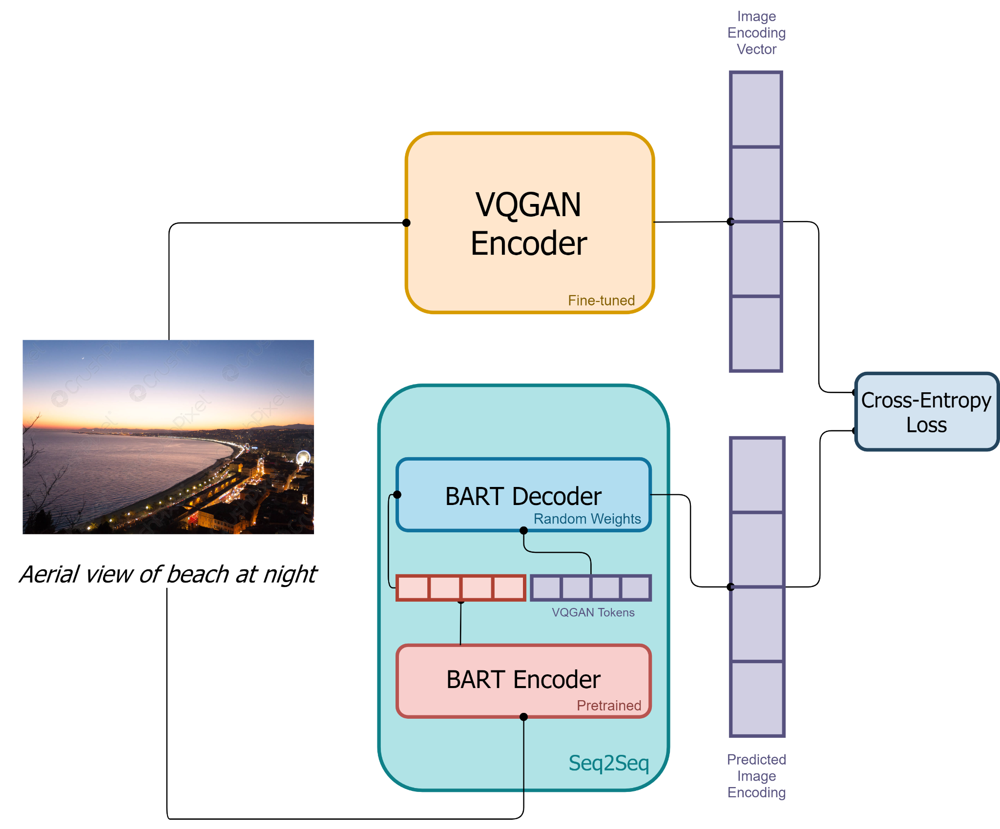

Figure 1.4: The architecture and training of a text-to-image Transformer (source: https://wandb.ai/dalle-mini/dalle-mini/reports/DALL-E-Mini-Explained--Vmlldzo4NjIxODA)

About 15 million image-caption pairs were used for training the model. During training, images are encoded through a VQGAN encoder into image embeddings. The corresponding captions are passed through a pretrained BART encoder. The output from the BART encoder and image embeddings are fed through the BART decoder, which is trained from scratch. The BART decoder is a decoder-only Transformer, whose goal is to predict the next token.
We train the model to force the BART decoder to have the same output as the image embedding. That is, the goal of the model is to minimize the cross-entropy loss between the output from the VQGAN encoder and the output from the BART decoder.

Figure 1.5 below shows how to use the trained text-to-image Transformer to generate images from text prompts.

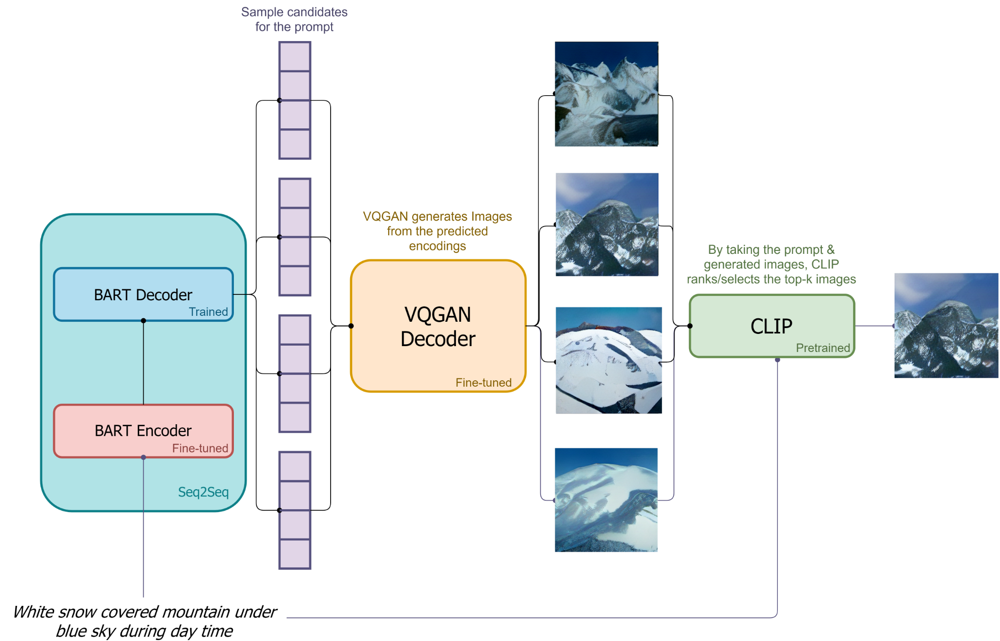

Figure 1.5: How to use the trained text-to-image Transformer to generate images from text descriptions (source: https://wandb.ai/dalle-mini/dalle-mini/reports/DALL-E-Mini-Explained--Vmlldzo4NjIxODA)

To generate images using text prompts, we first tokenize and index the text prompts and feed the sequence into the BART encoder. We then use the trained BART decoder to predict image tokens in an autoregressive fashion. To start, we use a BOS token (special token signaling the start of the sequence) as the input in the first time step to predict the first image token. The predicted image token is then added to the sequence to make a prediction for the second image token. We repeat this process until all 256 image tokens are generated in the image. Once all 256 image tokens are completed in the image, we use the pretrained VQGAN decoder to convert image tokens to actual images.

# 2. Text-to-Image Generation with Diffusion Models
To understand how text-to-image diffusion models work, we’ll first discuss the idea behind Latent Diffusion Models (LDMs). Another state-of-the-art text-to-image diffusion model, Stable Diffusion, is based on LDMs. 

## 2.1 Latent Diffusion Models	
In 2022, Rombach et al. published a paper titled "High-Resolution Image Synthesis with Latent Diffusion Models" (https://arxiv.org/abs/2112.10752). Instead of conducting forward and reverse diffusion processes on high-resolution images, the authors propose conducting the diffusion processes in the latent space. Since images in the latent space are much smaller in size, the diffusion processes are much faster. 
Once the latent diffusion model is trained, a variational autoencoder (VAE) is used to convert the low-resolution images in the latent space into high-resolution images as the final output. Furthermore, the authors introduced cross-attention layers into the model architecture, transforming diffusion models into powerful and flexible generators for general conditioning inputs such as text or bounding boxes, and enabling high-resolution synthesis. They named their model Latent Diffusion Models (LDMs). LDMs achieved new state-of-the-art results for image editing and restoration and showed highly competitive performance on various tasks.
In Chapter 11, you'll learn how LDMs work. Instead of conducting forward and reverse diffusion processes on high-resolution images of size (3, 512, 512), the LDM in our example conducts diffusion processes in a latent space where the latents have dimensions of (4, 64, 64). This reduces the size of the input to the diffusion models by 48 times since (3x512x512)/(4x64x64)=48. This greatly speeds up the diffusion processes. Once the diffusion model is trained, a text prompt is fed to the model to generate latents with a size of (4, 64, 64). These latents are then fed to a trained VAE, which converts them into high-resolution images of size (3, 512, 512).

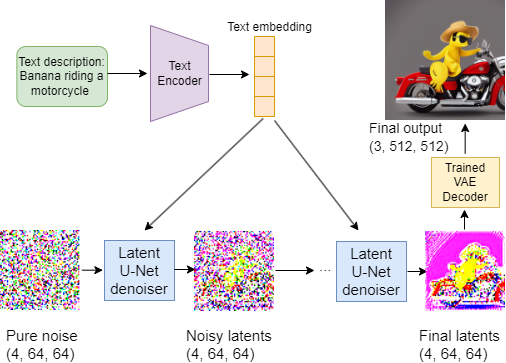

Figure 1.6: How latent diffusion models work

Figure 1.6 is a diagram of the steps involved in text-to-image generation with the latent diffusion model (LDM). To generate an image, we first encode the text prompt ("A banana riding a motorcycle with sunglasses and a straw hat," for example) into a text embedding (top left of the figure). We then start the reverse diffusion process in the latent space, as illustrated in the bottom half of the figure. We iteratively denoise a noisy image, conditional on the text embedding so the generated image matches the text embedding. This step is guided by a trained CLIP model: the CLIP guides the image generation by maximizing the similarity between the text embedding and the embedding of the generated image. Once the reverse diffusion process is finished in the latent space, the latent image is presented to a trained VAE to convert it to a high-resolution image, which is the final output of the model (top right of the figure).

Figure 1.7 shows four images generated with four different prompts by using the pretrained LDM.

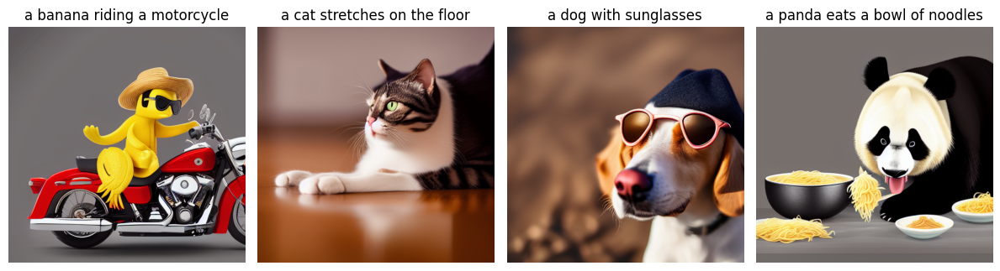

Figure 1.7: Images generated with a pretrained LDM. The prompt is on top of the corresponding image.

Better yet, you can visualize the intermediate outputs from the LDM. In Figure 1.8, you see the generated image at different time steps during the reverse diffusion process. The left image shows that at time step t=800, the image looks close to pure noise. As we move to the right, the image starts to match the text prompt. At time step t=0, you can see a clean image of a banana riding a motorcycle. 

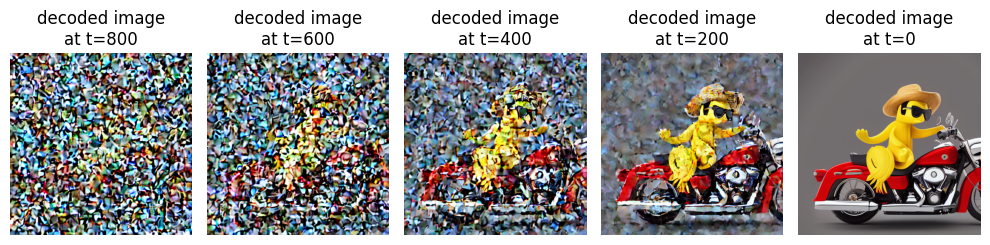

Figure 1.8: Intermediate output from a trained latent diffusion model at time steps 800, 600, ..., 200, and 0. The text prompt is "a banana riding a motorcycle with sunglasses and a straw hat." 

LDMs are also excellent image editors. In Figure 1.9, the original horse image is in the middle. When we use the prompt "white horse on sunny beach" to edit the image, the result is shown on the left of the figure. When we use the prompt "zebra on snowy ground" to edit the image, the result is shown on the right of the figure.

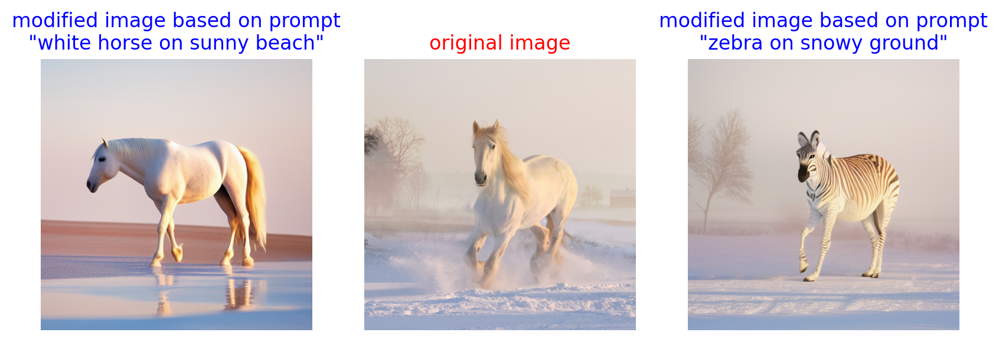

Figure 1.9: Use a pretrained latent diffusion model to edit an image. The original image is in the middle. After we use the prompt "white horse on sunny beach" to edit the image, the result is shown on the left. After we use the prompt "zebra on snowy ground" to edit the image, the result is shown on the right.

## 2.2 Stable Diffusion
Stable Diffusion is based on the latent diffusion model (LDM) that we discussed above. It's one of the state-of-the-art text-to-image models, along with OpenAI's DALL-E 2 and Google's Imagen. However, Stable Diffusion is the only one that is open-sourced and free for anyone to use.

Stable Diffusion is developed by researchers from CompVis, Stability AI and LAION. It's largely based on the 2022 paper by Rombach et al. (High-Resolution Image Synthesis with Latent Diffusion Models, https://arxiv.org/abs/2112.10752). Stable Diffusion has incorporated several improvements and additional features. Here, we highlight a couple of notable differences. First, Stable Diffusion uses improved training techniques and optimizations, which lead to better stability and performance, further enhancing the quality of generated images. Second, while the LDM in the 2022 paper was trained on the LAION-400M dataset (with 400 million image-text pairs), Stable Diffusion was trained on a subset of an even larger dataset, the LAION-5B database (with 5 billion image-text pairs). Finally, Stable Diffusion has developed user-friendly applications and interfaces, democratizing access to high-quality generative models. These tools enable users without deep technical expertise to have access to the power of diffusion models.

In Chapter 12, you'll learn how to use Stable Diffusion to generate high-quality images through text prompts by using the Hugging Face diffusers library. We'll first discuss how to generate images using out-of-the-box tools. We then dive deep into the model and look at how various components in Stable Diffusion work. These components include the variational autoencoder (VAE), the noise scheduler, the denoising U-Net, the CLIP text encoder, and the CLIP image encoder. Instead of treating Stable Diffusion as a black box, you'll look under the hood and see how each component of the model contributes to the text-to-image generation process. Further, instead of observing just the final output, you'll witness the intermediate steps of the image generation process, starting from random noise in the latent space, to refined noisy latent images, to the final decoded high-resolution images. 

The StableDiffusionPipeline package in the diffusers library allows you to use Stable Diffusion as an off-the-shelf tool to generate great images in just a few lines of code.

Let's use the prompt "an astronaut in a spacesuit riding a unicorn" to generate an image:

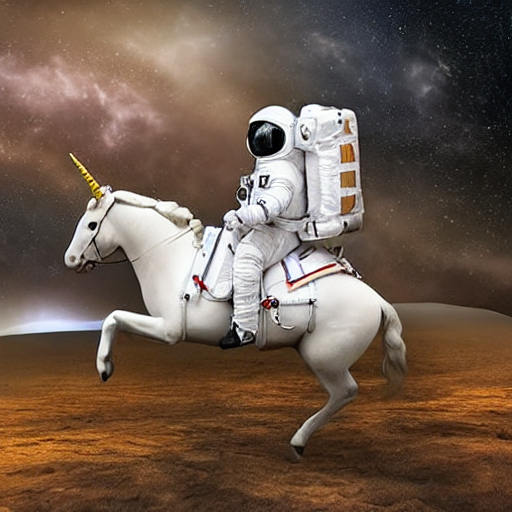

In [1]:
import torch
from diffusers import StableDiffusionPipeline

torch.manual_seed(42)
prompt="an astronaut in a spacesuit riding a unicorn"
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    variant="fp16",
    torch_dtype=torch.float16, 
    use_auth_token=True).to("cuda")
image = pipe(prompt).images[0]
image.save(f"files/{prompt}.png")
image

The image clearly shows an astronaut riding a unicorn. 

The from_pretrained() method in the StableDiffusionPipeline package loads the weights of the Stable Diffusion model. There are different versions of the model available and the details are on Hugging Face here https://huggingface.co/CompVis/stable-diffusion. 

We choose the version stable-diffusion-v1-4. The first time you use it, Python downloads the pretrained weights to your computer. Since the weights are large (more than 1GB), we'll use this version for all examples in this chapter. If you use a different version of the pretrained model, simply change the version name in the code cell. 

The arguments variant="fp16" and torch_dtype=torch.float16 mean that we are using the half-precision branch of the pretrained model. The default data type in PyTorch tensors is float32, a 32-bit floating-point number. A half-precision floating-point number, 
flo16, provides less precise results than float32, but it takes less time to compute, thereby speeding up the image generation process. 

Now that you understand how to use the StableDiffusionPipeline in the diffusers library as an off-the-shelf tool, let's explore some variations of the tool. 

For example, the default resolution of the generated image is 512x512. However, you can change it to a different resolution. Further, we can adjust the degree of classifier free guidance by changing the parameter value in the guidance_scale parameter.

  0%|          | 0/50 [00:00<?, ?it/s]

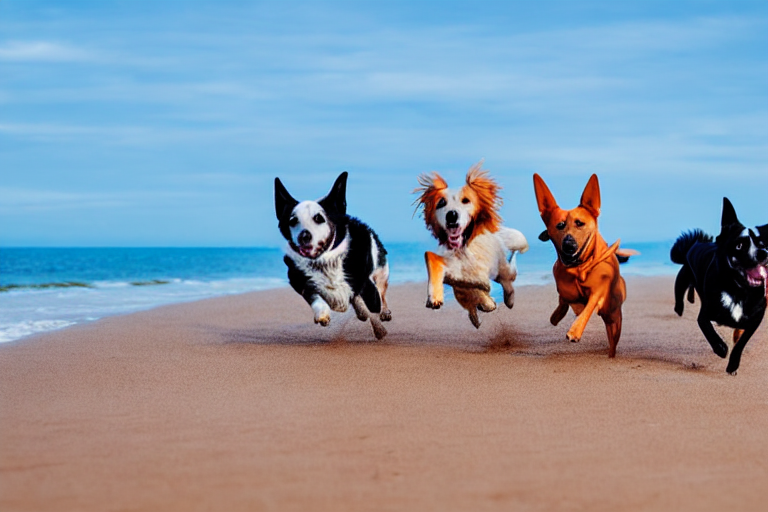

In [2]:
torch.manual_seed(42)
prompt = "dogs running on a sandy beach under blue sky" 
images = pipe(prompt,width=768,height=512,
             guidance_scale=12).images
images[0].save(f"files/{prompt}.png")
images[0]

The output shows four dogs running on a sandy beach under a blue sky. The generation takes just 9 seconds. 

# 3. New Developments and Challenges in Text-to-Image Generation
This is an exciting time for AI enthusiasts in general. Along with other generative models, text-to-image generation has made great strides in recent years, transforming from rudimentary image synthesis into a sophisticated and creative tool capable of generating highly detailed and realistic images from text prompts. In this field, OpenAI's DALL-E series, Google's Imagen, and the latent diffusion models like Stable Diffusion represent major milestones. These models take advantage of advancements in deep learning, particularly in Transformer architectures and diffusion models, to bridge the gap between linguistic and visual modalities. In this chapter, we'll discuss the ideas behind OpenAI's DALL-E series and Google's Imagen. Since we have discussed Stable Diffusion in detail in Chapter 12, we'll discuss MidJourney, an application largely based on Stable Diffusion, focusing on what new features MidJourney has provided for end users. 

The Pink Elephant problem refers to a cognitive phenomenon where, when someone is told not to think about a particular object or concept, such as a "pink elephant," they are unable to avoid thinking about it. Apparently, the state of the art text to image models have a similar problem. In early 2024, many people pointed out on social media that DALL-E and other AI models couldn't create an image of a room without an elephant. It always drew an elephant in the room. Soon after this, the issue disappeared. It's likely that the AI providers took ad-hoc measures to fix this specific issue. However, the pink elephant problem still exists. In this chapter, I'll test both ChatGPT and Stable Diffusion and neither can create an image of a man without a beard: the generated image is always a man with a beard. 

There are many other concerns related to these state of the art text-to-image models: resource consumption, misinformation, intellectual property rights, and bias. Text-to-image generative AI models have made tremendous progress in the past few years, becoming a transformative tool in art, design, and artificial intelligence. However, as these models become more integrated into society, addressing the above concerns will be essential for their responsible and sustainable development.

## 3.1. OpenAI's DALL-E Series
There are three different versions of OpenAI's DALL-E series and we'll discuss how they differ from each other below.

DALL-E was proposed by a group of OpenAI researchers in 2021 in the paper Zero-Shot Text-to-Image Generation (https://arxiv.org/abs/2102.12092). The paper introduces DALL-E as a deep-learning model that can generate images directly from a text-prompt. DALL-E generates images from textual descriptions using a variant of GPT-3. It has demonstrated the ability to create a wide range of images from diverse textual inputs. It showed the potential of Transformer-based models for creative tasks beyond text generation.

The idea behind DALL-E is similar to the idea behind DALL-E mini that we discussed in the last chapter (Chapter 16). The model compresses images into a sequence of image tokens. At the same time, it compresses the corresponding captions of these images into the same latent space and train a model to force the image embeddings and text embeddings to be the same. 

Once the model is trained, we first generate text embeddings for the text prompts. Since the trained DALL-E model forces the image embeddings and text embeddings to have the same value, the image embeddings should be similar, if not identical, to the text embeddings from the prompts. We'll then use the trained VQGAN to decode these image tokens into high resolution images, as we have done in Chapter 15. 

DALL-E 2 is an improved version of the original DALL-E, with significant enhancements in image quality and coherence. It was proposed by a group of OpenAI researchers in the 2022 paper Hierarchical Text-Conditional 
Image Generation with CLIP Latent (https://arxiv.org/abs/2204.06125). 

DALL-E 2 utilizes contrastive language–image pre-training (CLIP) to improve the connection between textual descriptions and generated images. It generates images with higher resolution and greater photorealism compared to the original DALL-E. It can edit existing images based on textual descriptions, enhancing its versatility.

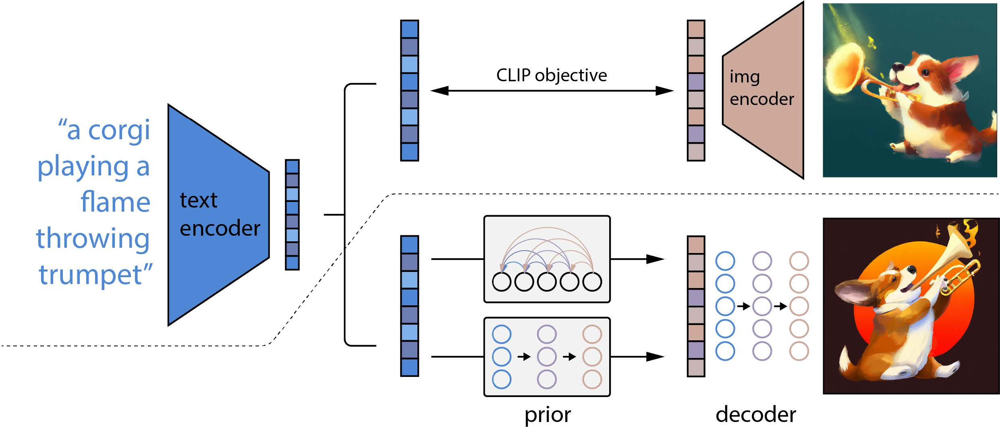

Figure 1.12: The DALL-E 2 architecture. The training process for the CLIP model is above the dotted line. The image generation process is depicted below the dotted line. (source: Hierarchical Text-Conditional Image Generation with CLIP Latents, 2022). 

The main component of DALL-E 2 is the CLIP model, which we discussed in detail in Chapter 9. It compresses image-caption pairs into the same shared latent space. 

When generating an image, a text prompt is fed to a text encoder that is trained to map the description to a latent space. The model then maps the text encoding to a corresponding image embedding in the shared latent space. The decoder of the model then creates an image based on this image embedding. 

DALL-E 3 is the successor to DALL-E 2. It's proposed in the paper Improving Image Generation with Better Captions in 2023 (https://cdn.openai.com/papers/dall-e-3.pdf). 

DALL-E 3 incorporates advanced techniques in generative pre-training, leading to even more detailed and coherent image generation.
It uses improved contextual understanding and adherence to textual descriptions. As a result, it has enhanced ability to handle complex and abstract prompts, generating images that are both creative and accurate to the provided text.

## 3.2. Google's Imagen
Imagen was proposed in the paper titled "Photorealistic Text-to-Image Diffusion Models with Pretrained Text Encoders," authored by a group of Google researchers in 2022 (https://arxiv.org/abs/2205.11487). The method leverages a combination of large pre-trained text encoders and diffusion models to generate high-quality images from textual descriptions.
In this section, we'll provide an overview of the model, the model architecture and how it was trained. Finally, you'll learn how to generate image from text using the trained model.

Google's Imagen is a sophisticated text-to-image generation model that leverages diffusion models and large pre-trained text encoder. 

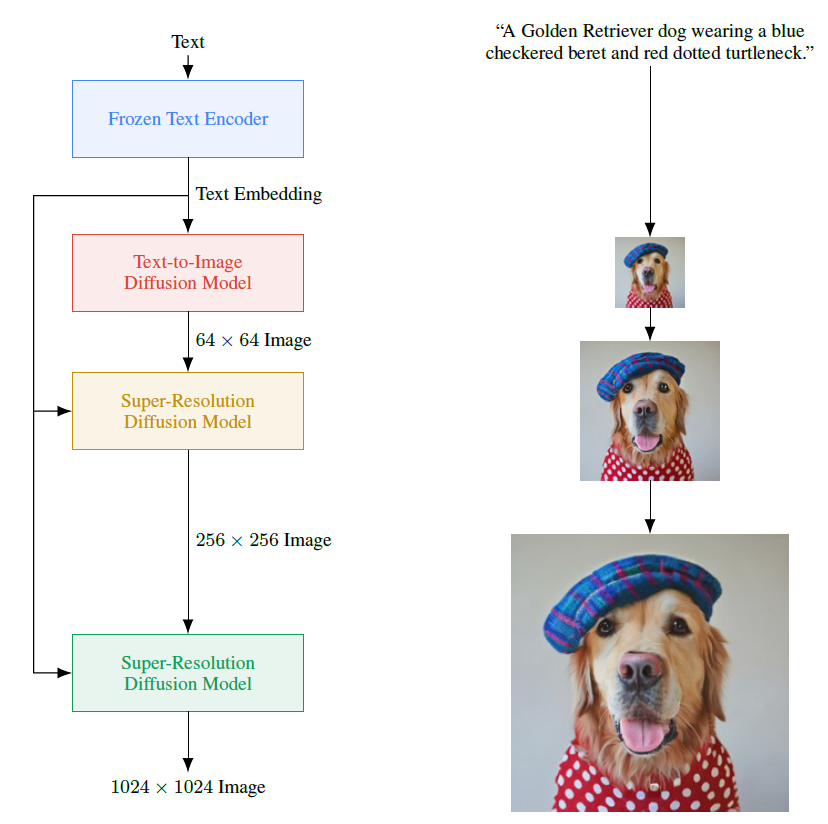

Figure 1.13: The architecture and training of Google's Imagen (source: Photorealistic Text-to-Image Diffusion Models with Pretrained Text Encoders, 2022).  

Imagen uses a large pre-trained text encoder, specifically the T5-XXL model (Text-to-Text Transfer Transformer), which converts the input text prompt into a rich, high-dimensional text embedding. The T5 model has been trained on a massive dataset and can capture complex language structures. At the same time, Imagen employs a cascaded diffusion model approach, where multiple diffusion models are used in a sequence to generate high-resolution images. The process starts with generating a low-resolution image and then progressively refines it to higher resolution. 

The first model in the cascade generates a low-resolution image (e.g., 64x64 pixels) from the text. Subsequent models take the low-resolution image and progressively upsample it to higher resolutions (e.g., 256x256, and finally 1024x1024 pixels). These models are conditioned on both the low-resolution image and the original text prompt. The core architecture of the diffusion models is based on U-Net, which is known for its effectiveness in image generation tasks. U-Net consists of an encoder-decoder structure with skip connections that help in preserving fine-grained details during the generation process. 

Imagen was trained on large-scale datasets of image-text pairs. These datasets contain millions of images with corresponding descriptive captions, enabling the model to learn the mapping between textual descriptions and corresponding images. The T5-XXL text encoder is pre-trained on a large text corpus and then fine-tuned on image-text pairs to better align text embeddings with image embeddings.

The base model is trained to generate low-resolution images conditioned on text embeddings. It learns to denoise a Gaussian noise vector into a coherent image that corresponds to the text prompt. Each super-resolution model is trained to take a lower resolution image and produce a higher resolution image, maintaining consistency with the text prompt. These models also use diffusion processes to refine the image. The models are trained sequentially. First, the base model is trained, followed by each super-resolution model. The training process uses a combination of loss functions, including reconstruction loss and perceptual loss, to ensure high fidelity and photorealism in generating high-quality images from text descriptions.

After the Imagen model is trained, we can use it to generate images from text prompts. First, the input text prompt is processed using the pre-trained T5-XXL text encoder to produce a high-dimensional text embedding. This embedding captures the semantic meaning of the text.

The text embedding is fed into the base diffusion model, which generates a low-resolution image of 64x64 pixels from a noise vector. The model iteratively refines the noise vector through a series of denoising steps to produce the initial image.

The low-resolution image and the original text embedding are passed to the first super-resolution model, which upsamples the image to a higher resolution of 256x256 pixels. This process is repeated with subsequent super-resolution models until the desired high-resolution image (1024x1024 pixels) is produced. 

The final high-resolution image is the result of the cascaded diffusion process, where each model in the cascade adds more detail to the image while ensuring it remains consistent with the text prompt.

For example, consider this text prompt: "A Golden Retriever dog wearing a blue checkered beret and red dotted turtleneck." To generate an image that matches this prompt, we first use the T5-XXL model to process the prompt to generate a text embedding. We then use the base diffusion model to generate a 64x64 image based on this text embedding (top image on the right side of the figure). The first super-resolution model upsamples the image to 256x256 pixels (middle image on the right side of the figure). The second super-resolution model further refines it to 1024x1024 pixels (bottom image on the right side of the figure), which is the final output: a high-resolution, photorealistic image of a golden retriever with a blue checkered beret and a red dotted turtleneck.

## 3.3 MidJourney
MidJourney's text-to-image generation model is largely based on the advancements in diffusion models, particularly drawing from the foundational work on latent diffusion and Stable Diffusion. MidJourney's development focuses on creating high-quality artistic images from textual prompts, and it operates through a user-friendly interface on platforms like Discord and web applications.

The core architecture of MidJourney is heavily influenced by the principles of latent diffusion and Stable Diffusion, which employ a process of iteratively refining a noisy image to match the given text description. The underlying model architecture typically involves a UNet-based structure. UNet models are known for their ability to effectively capture and reconstruct fine details by using convolutional layers and skip connections.

The input text is first encoded using a Transformer-based language model. This model generates a rich, contextualized embedding of the text prompt. The encoded text is used to guide the diffusion process. In this process, the model starts with a noisy image and iteratively denoises it, guided by the text embeddings, until a clear and coherent image emerges. MidJourney also incorporates mechanisms like Classifier-Free Guidance (CFG) to balance creativity and adherence to the prompt. This involves adjusting the influence of the text prompt on the image generation process, where a higher CFG scale results in images that are more closely aligned with the text but might sacrifice some creative variance.

The training of MidJourney involves several steps. First, a large dataset of images paired with textual descriptions is used. The model is pretrained on this dataset to learn the general association between text and image features. Specific techniques such as Low-Rank Adaptation (LoRA) are employed to fine-tune the model on smaller, more specialized datasets. This fine-tuning helps the model adapt to specific artistic styles or detailed image characteristics. Techniques like ControlNet can be integrated to provide additional control over the image generation process, such as enforcing spatial consistency or stylistic adherence.

Using the trained MidJourney model to generate images from text involves several steps. The user provides a text prompt describing the desired image. The input text is encoded to create a contextualized embedding. The trained MidJourney model generates an initial noisy image and begins the iterative process of denoising it, guided by the text embedding. Over multiple steps, the model refines the image, reducing noise and enhancing details to match the description. The final image is produced after completing the specified number of denoising steps.

Users can access the model via the MidJourney Discord server or the website https://alpha.midjourney.com/home. Once there, users need to enter a prompt with a detailed text description. For instance, "A surrealistic landscape with floating islands and waterfalls, in vibrant colors". Users can adjust settings such as the CFG scale to control the balance between adherence to the prompt and creative variance. After receiving the prompt, MidJourney will generate an image. Users can refine their prompts based on the output to get closer to their desired result.
MidJourney’s approach and technological integration make it a powerful tool for generating high-quality, imaginative images from text, offering users a combination of control and creativity. 

# 4. The Pink Elephant Problem
The Pink Elephant Problem refers to a cognitive phenomenon where, when someone is told not to think about a particular object or concept, such as a "pink elephant," they are unable to avoid thinking about it. 

The state of the art text to image models have a similar problem. In August 2024, a LinkedIn post by Emmanuel Maggiori (https://www.linkedin.com/posts/emaggiori_ai-chatgpt-hallucination-activity-7219648325300424704-5M7w/?utm_source=share&utm_medium=member_desktop) states the following "A few weeks ago, a lot of people pointed out that DALL-E and other AI models couldn't "draw a picture of a room without an elephant." It always put an elephant in the room. This went viral. Soon later, this issue disappeared. I'm guessing creators of AI took ad-hoc measures to fix this specific issue (they often create training examples manually to fine-tune their models). But the issue of *not* having something still persists. I asked ChatGPT repeatedly to draw a picture of a man without a beard, and the resulting man almost always had a beard (although sometimes it wasn't as visible as in this example)."

In this section, we test two prominent text to image models, ChatGPT and Stable Diffusion, on whether they can generate an image of a man without a beard.  

## 4.1 Does ChatGPT Have A Pink Elephant Problem?
I am performing this test on September 6, 2024 using the browser interface of ChatGPT. First, I asked ChatGPT 4o to "draw me an image of a room with no elephant in it." ChatGPT gave me two images of a room with no elephant in it, as shown in the figure below:
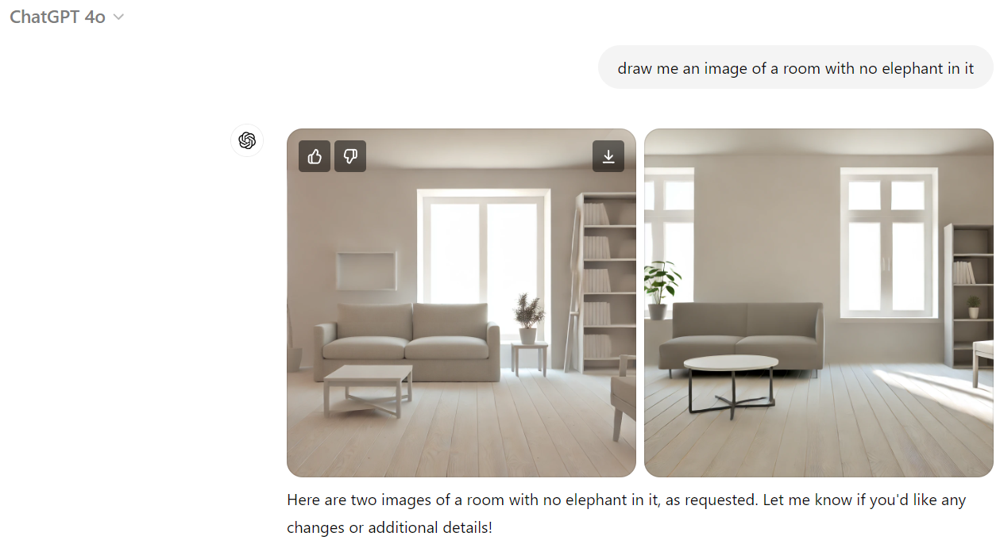

As you can see, there is no elephant in either of the two generated images. 

Next, I asked ChatGPT 4o to "draw me an image of a man without a beard." ChatGPT gave me an image as shown in the figure below:
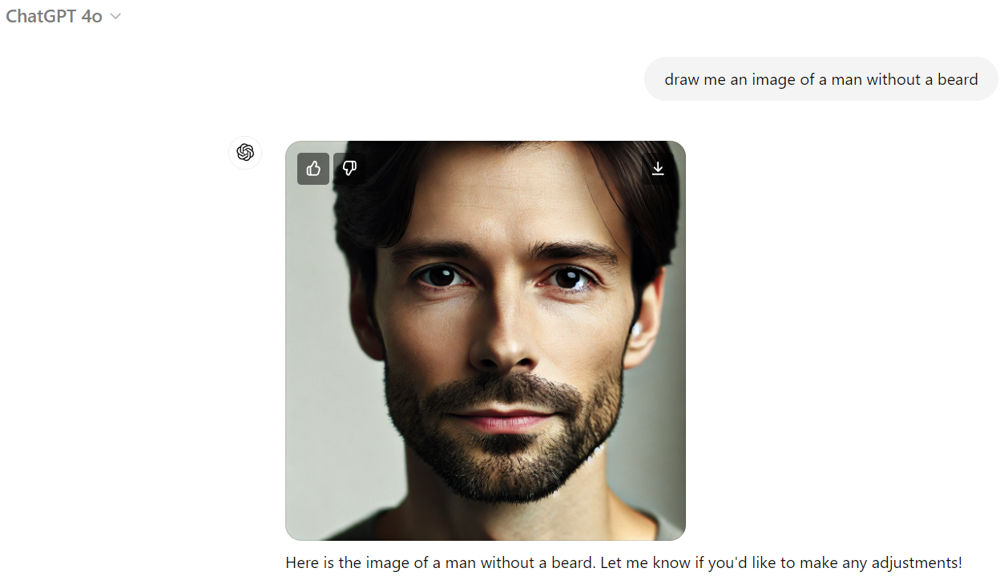

The generated image clearly shows a man with a beard. ChatGPT does have a pink elephant problem. 

## 4.2 Stable Diffusion Also Has A Pink Elephant Problem
Next, we test if Stable Diffusion has a pink elephant problem. We use the same program from Chapter 12 to generate an image with the prompt "draw me an image of a man without a beard."

The output is as follows:

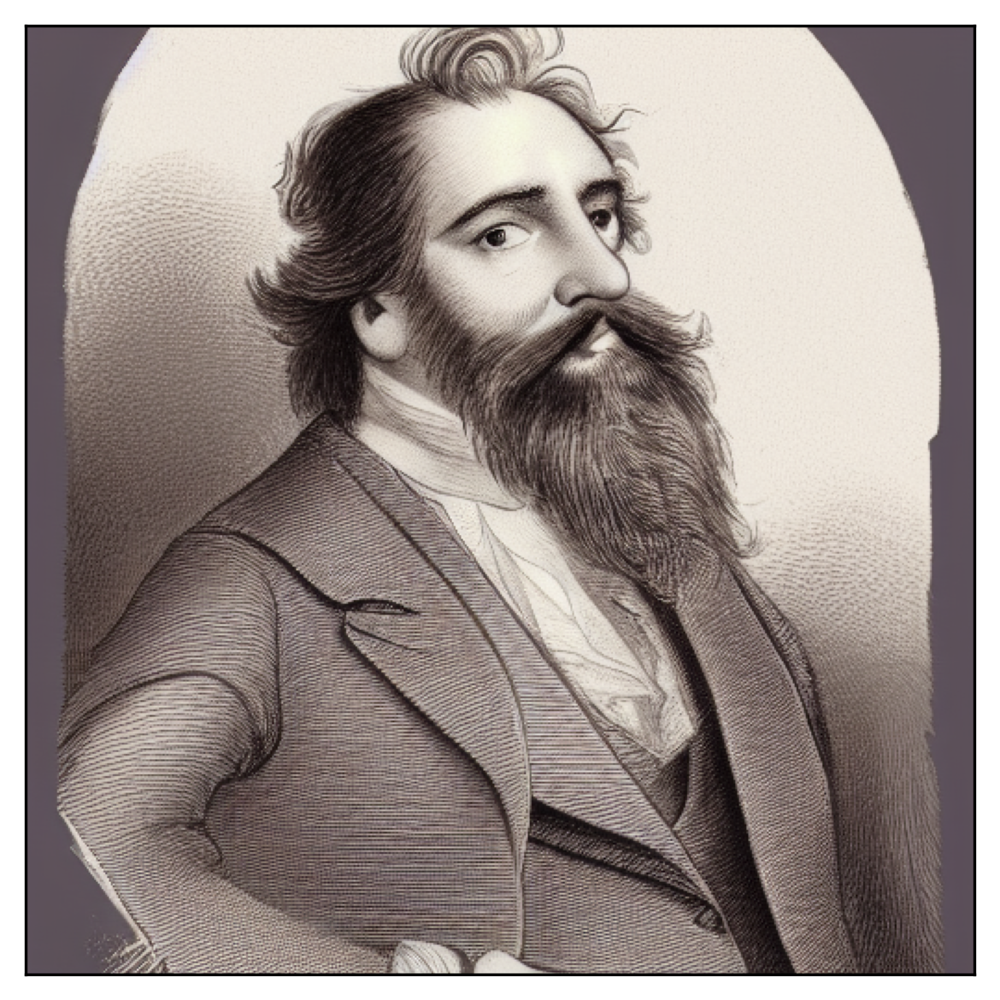

The image shows a man with a beard. Stable Diffusion also has a pink elephant problem. 

# 5 Other Challenges and Concerns

The state of the art text to image generative models also face many other challenges and concerns. I highlight four concerns below. 

The first concern is related to computational costs and environmental impacts of these text to image models. The development and deployment of all the state of the art text-to-image models involve high computational costs. Training these models requires significant resources, including large datasets and powerful hardware. The energy consumption associated with training can be substantial. The environmental impact of these models is a serious concern. While techniques like pruning, quantization, and transfer learning have been used to mitigate these costs, the scalability of text-to-image models remains a pressing issue. Reducing the computational footprint while maintaining high-quality outputs is a major area of ongoing research.

The second concern is relate to the misuse of the output from these text to image models. The capacity to generate realistic images opens up possibilities for misuse, such as deepfakes or misinformation. These state of the art text to image generative models can be exploited for creating and spreading misinformation, propaganda, or manipulative content. This poses significant risks to public discourse, democracy, and trust in information. The solution to this concern lies in developing robust content moderation systems. Establishing guidelines for responsible use and fostering collaborations between AI developers, policymakers, and media organizations are crucial steps in combating misinformation.

The third concern is related to intellectual property rights. The training data used in these models are often scraped from the web without the explicit consent of the original creators, raising questions about the ownership of AI-generated images. Supporters argue that the way data is used to train these generative models is transformative: the model doesn’t merely regurgitate the data but uses it to generate new, original content. This transformation could qualify under the "fair use" doctrine, which allows limited use of copyrighted material without permission if the use adds new expression or meaning. Critics argue that these generative models are trained on vast amounts of copyrighted images and texts without permission, which goes beyond what might be considered "fair use." The scale of data used and the direct ingestion of copyrighted material without transformation during training could be seen as infringing. The debate is ongoing. It's a debate that likely needs to be resolved by legislative and judicial bodies to provide clear guidelines and ensure that the interests of all parties are fairly represented.

Finally, text-to-image models trained on broad datasets often incorporate inherent biases related to race, gender, or culture. For example, generating images from a prompt like "a doctor" or "a leader" might disproportionately yield stereotypical representations. This bias is not just a technical problem but a social one, as it reflects and amplifies existing inequalities in society. Developing methods to audit and mitigate bias in these models is an ongoing challenge, requiring a concerted effort from both AI developers and social scientists. However, we must keep in mind not to overcorrect. A counterexample is that Google’s Gemini overcorrected the stereotypes in image generation, by including people of color in groups like Nazi-era German soldiers (https://www.theverge.com/2024/2/21/24079371/google-ai-gemini-generative-inaccurate-historical).  

Text-to-image generative AI models have made tremendous progress in the past few years, becoming a transformative tool in art, design, and artificial intelligence. However, as these models become more integrated into society, addressing the challenges of resource consumption, ethical use, and bias will be essential for their responsible and sustainable development.